In [13]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import ast
import os

plt.style.use('seaborn')

np.__version__

/tmp/ipykernel_71583/2492858149.py:9: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


'1.24.4'

In [21]:
df = pd.read_csv('./Data/CSV/TLBR_29.csv')
df

,Unnamed: 0,Top-Left,Bottom-Right,Id
0,0,"[338, 133]","[469, 185]",0
1,1,"[662, 126]","[795, 178]",1
2,2,"[822, 133]","[923, 185]",2
3,3,"[592, 250]","[694, 314]",3
4,4,"[735, 253]","[846, 308]",4
...,...,...,...,...
427,427,"[1431, 3257]","[1474, 3326]",427
428,428,"[1491, 3257]","[1656, 3322]",428
429,429,"[1670, 3257]","[1834, 3333]",429
430,430,"[1854, 3261]","[2047, 3312]",430


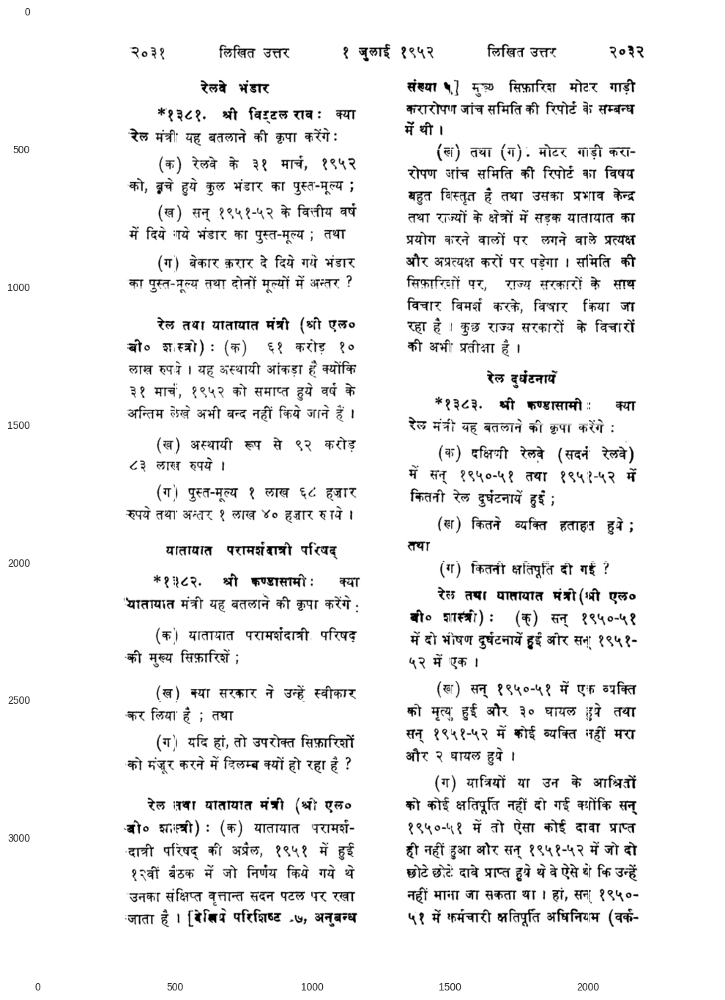

In [22]:
img = plt.imread('./Data/images/29.jpg')
plt.figure(figsize=(12, 20))

plt.imshow(img)


In [23]:
def visualize_bboxes(img, df, show = False):
    img_2 = img.copy()
    for index, rows in tqdm(df.iterrows()):
        top_left = (int(rows['Top-Left'].split(',')[0][1:]),int(rows['Top-Left'].split(',')[1][:-1]))
        bottom_right = (int(rows['Bottom-Right'].split(',')[0][1:]),int(rows['Bottom-Right'].split(',')[1][:-1]))
        # print(top_left)
        cv2.rectangle(img_2, top_left, bottom_right, (255, 0, 0), 2)

    if show:
        plt.figure(figsize=(12, 20))
        plt.imshow(img_2)
        
    return img_2

0it [00:00, ?it/s]

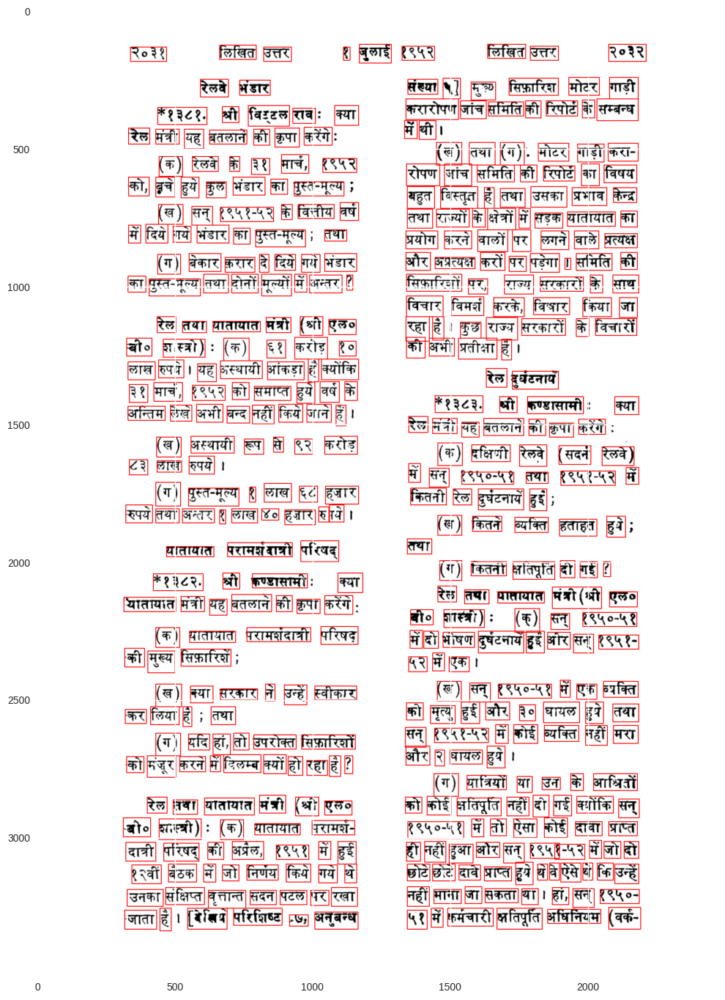

In [24]:
img_boxes = visualize_bboxes(img, df, show=True)


In [6]:
df2 = df.copy()
df2['Top-Left'] = df['Top-Left'].apply(ast.literal_eval)
df2['Bottom-Right'] = df['Bottom-Right'].apply(ast.literal_eval)


In [7]:
class WordCluster:
    def __init__(self, df, img, hor_threshold, ver_threshold):
        self.df = df
        self.hor_threshold = hor_threshold
        self.ver_threshold = ver_threshold
        self.img = img.copy()
                
    # calculate euclidean distance 
    def calculate_distance(self, p, q):
        return (((p[0] - q[0]) ** 2) + ((p[1] - q[1]) ** 2)) ** 0.5
    
    # find ids of nearset boxes 
    def find_connection(self, p, idx, mid_fxn, threshold):
        dist, min_id = 1000000, 0
        
        for i in range(len(self.df)):
            if i == idx:
                continue
            d = self.calculate_distance(p, mid_fxn(i))
            if d < dist:
                dist = d
                min_id = i

        if dist < threshold:        
            cv2.line(self.img, p, mid_fxn(min_id), (0, 255, 0), 3)
            return min_id
        else:
            return -1
    
    # top mid coordinate
    def get_top_mid(self, idx):
        p, q = self.df.iloc[idx, 1], self.df.iloc[idx, 2]
        return (int((p[0] + q[0])/2), p[1])
    
    # bottom mid coordinate
    def get_bottom_mid(self, idx):
        p, q = self.df.iloc[idx, 1], self.df.iloc[idx, 2]
        return (int((p[0] + q[0])/2), q[1])
        
    # left mid coordinate
    def get_left_mid(self, idx):
        p, q = self.df.iloc[idx, 1], self.df.iloc[idx, 2]
        return (p[0], int((p[1] + q[1])/2))
    
    # right mid coordinate
    def get_right_mid(self, idx):
        p, q = self.df.iloc[idx, 1], self.df.iloc[idx, 2]
        return (q[0], int((p[1] + q[1])/2))
        
    def fit(self):
        for i in tqdm(range(len(self.df))):
            right_mid = self.get_right_mid(i)
            self.find_connection(right_mid, i, self.get_left_mid, self.hor_threshold)
            
            bottom_mid = self.get_bottom_mid(i)
            self.find_connection(bottom_mid, i, self.get_top_mid, self.ver_threshold) 
            
        

In [11]:
wc = WordCluster(df2, img_boxes, 60, 50)
wc.fit()

  0%|          | 0/432 [00:00<?, ?it/s]

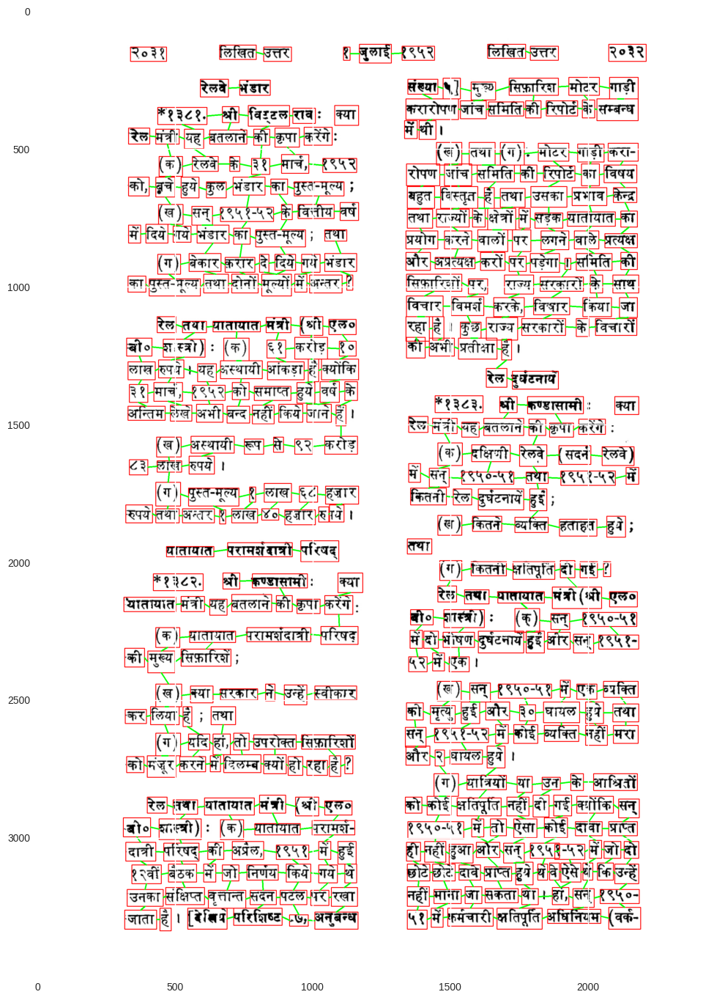

In [12]:
plt.figure(figsize=(12, 20))
plt.imshow(wc.img)

0it [00:00, ?it/s]

  0%|          | 0/432 [00:00<?, ?it/s]

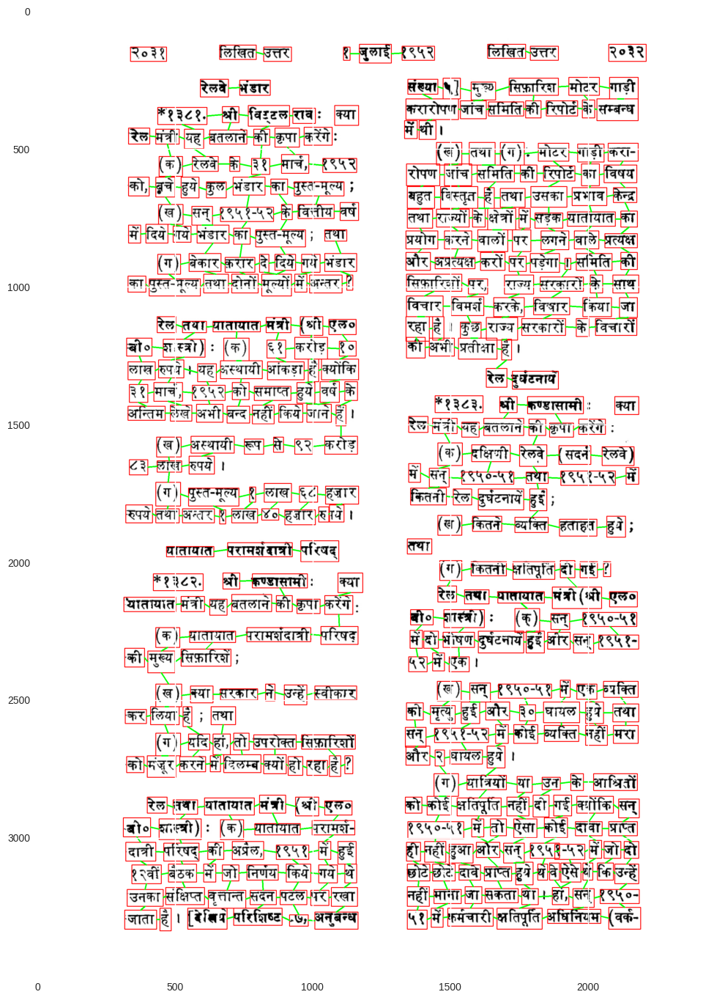

0it [00:00, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

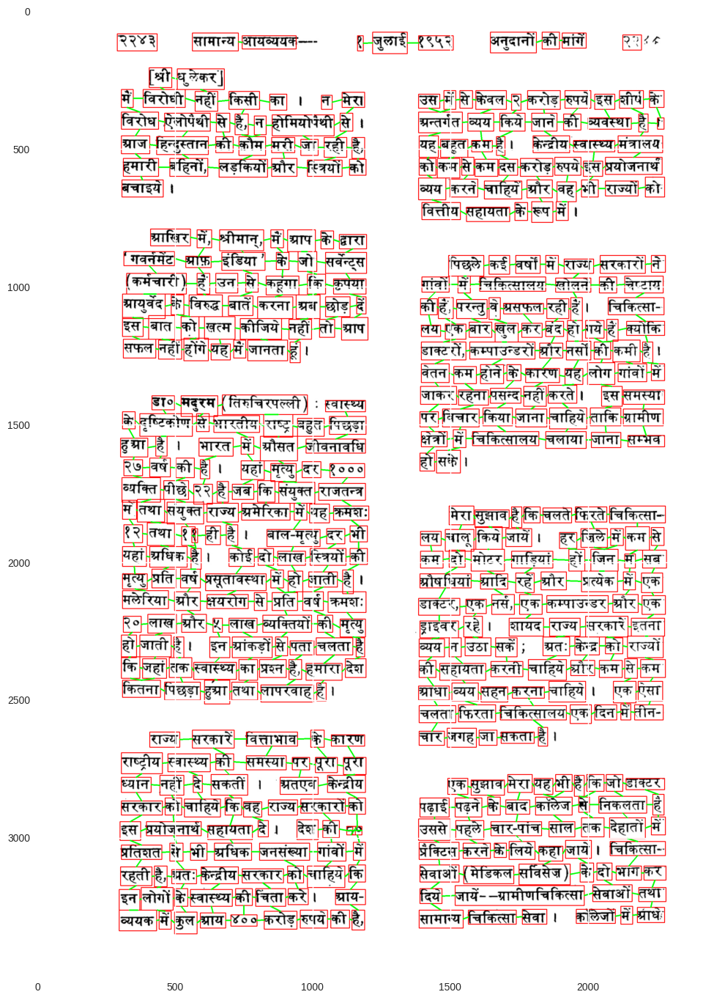

0it [00:00, ?it/s]

  0%|          | 0/261 [00:00<?, ?it/s]

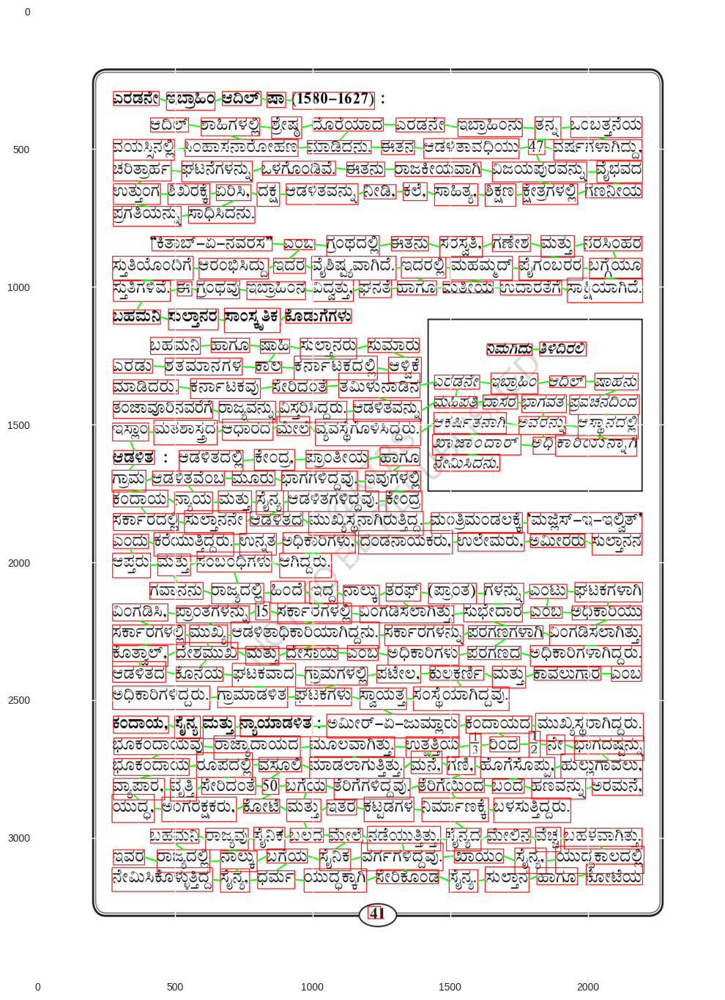

0it [00:00, ?it/s]

  0%|          | 0/258 [00:00<?, ?it/s]

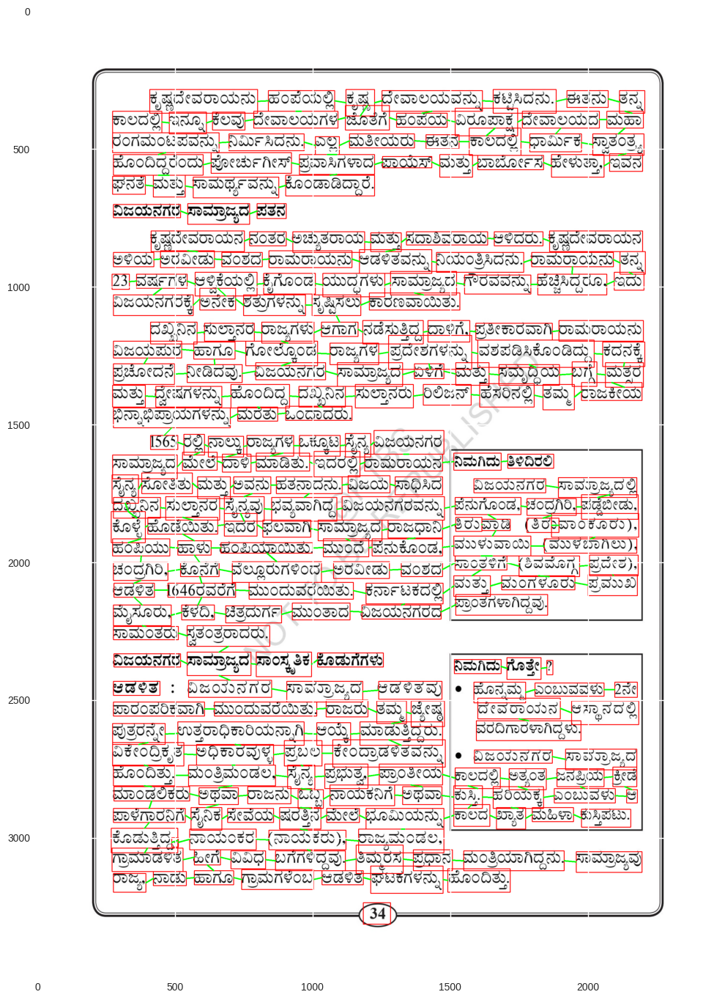

0it [00:00, ?it/s]

  0%|          | 0/148 [00:00<?, ?it/s]

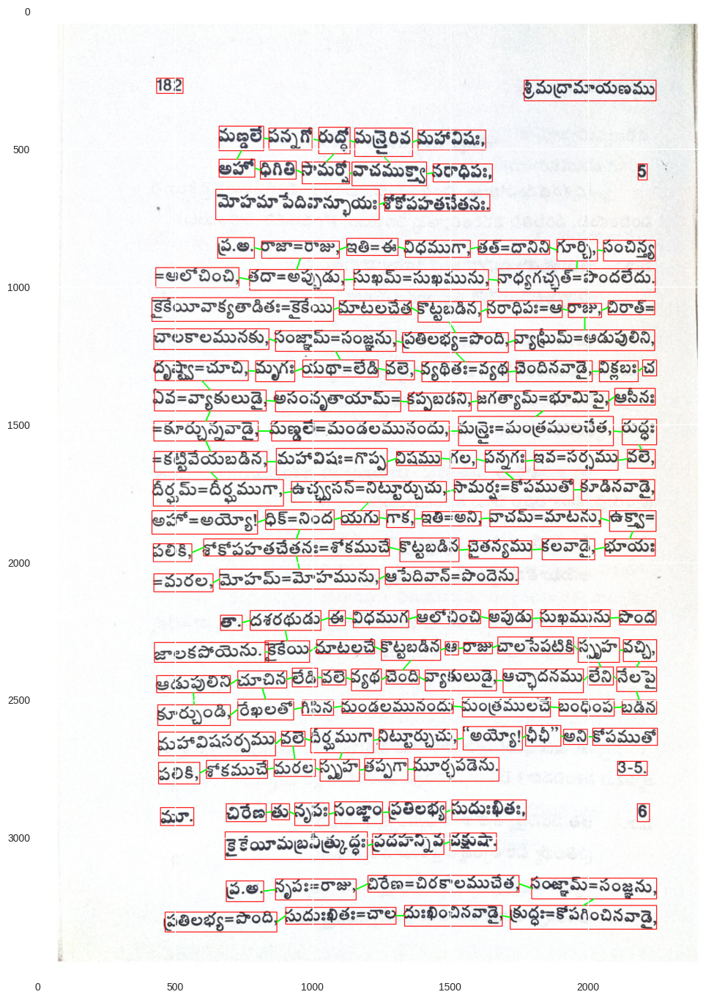

0it [00:00, ?it/s]

  0%|          | 0/129 [00:00<?, ?it/s]

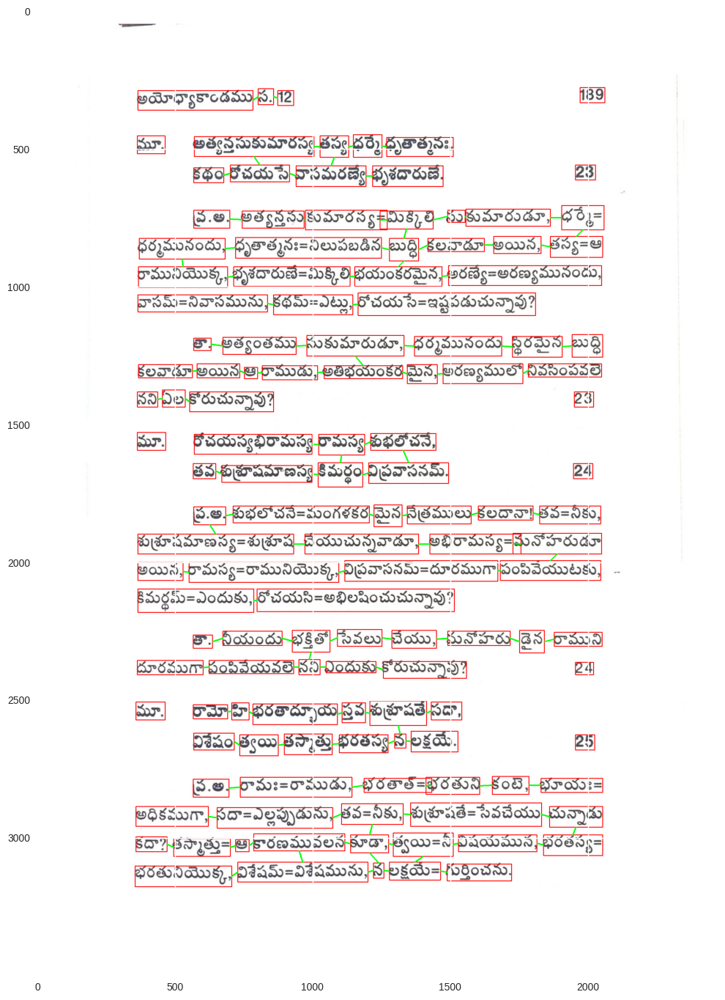

0it [00:00, ?it/s]

  0%|          | 0/571 [00:00<?, ?it/s]

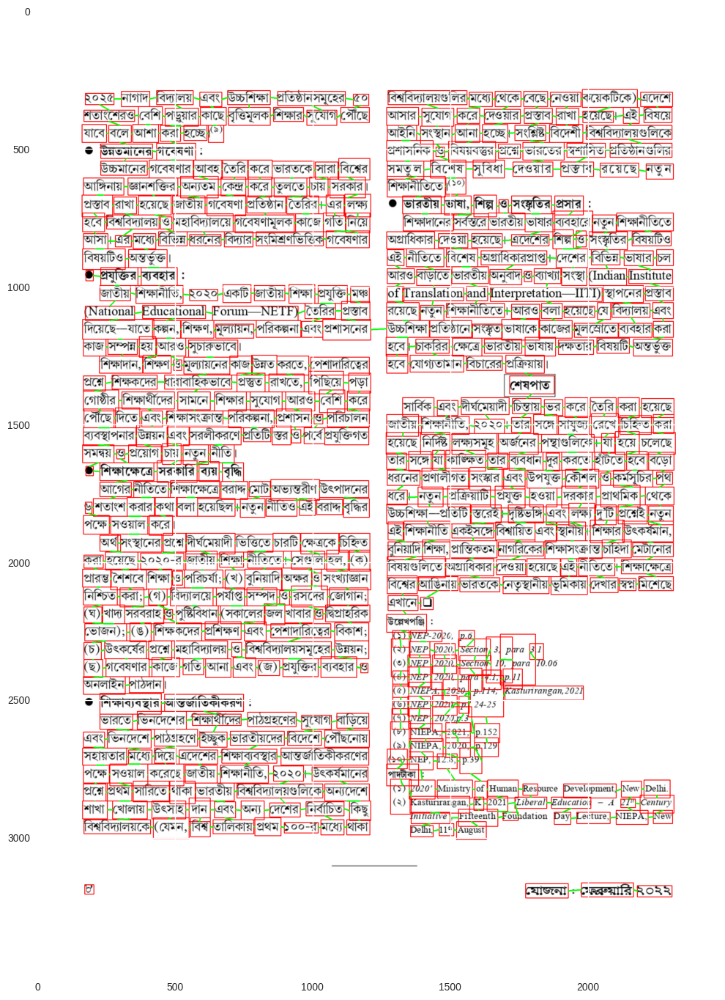

0it [00:00, ?it/s]

  0%|          | 0/363 [00:00<?, ?it/s]

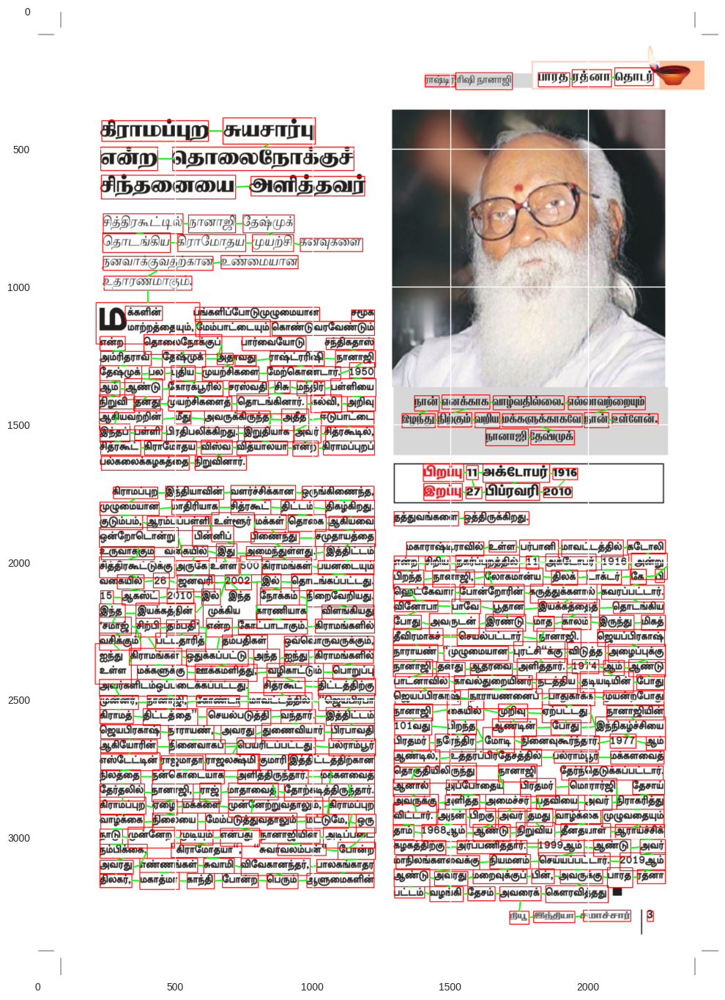

0it [00:00, ?it/s]

  0%|          | 0/838 [00:00<?, ?it/s]

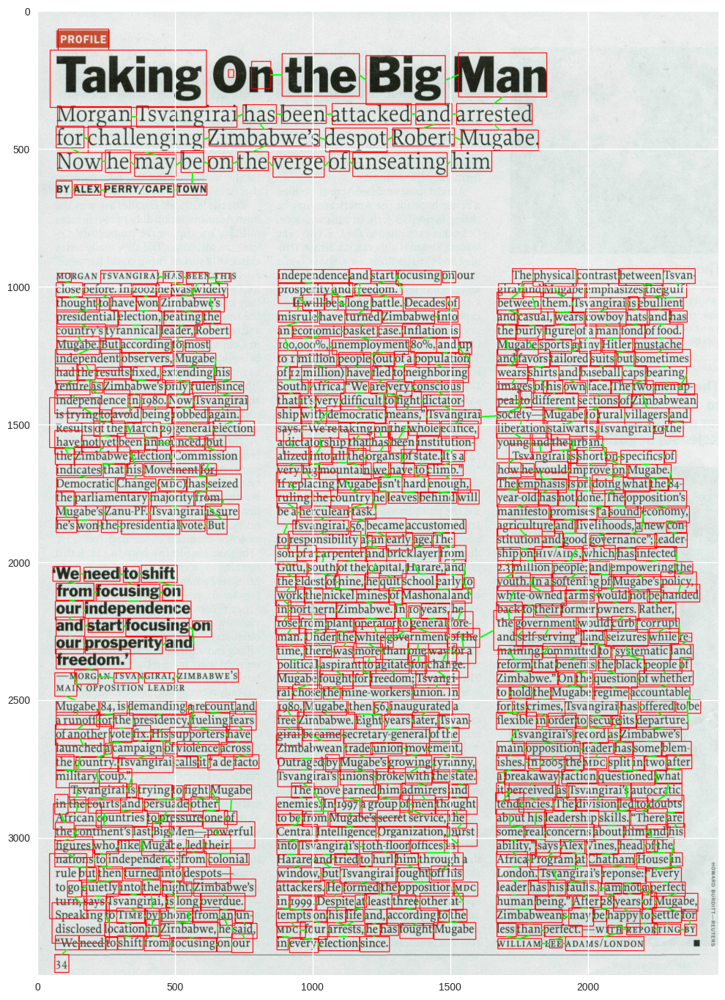

0it [00:00, ?it/s]

  0%|          | 0/1068 [00:00<?, ?it/s]

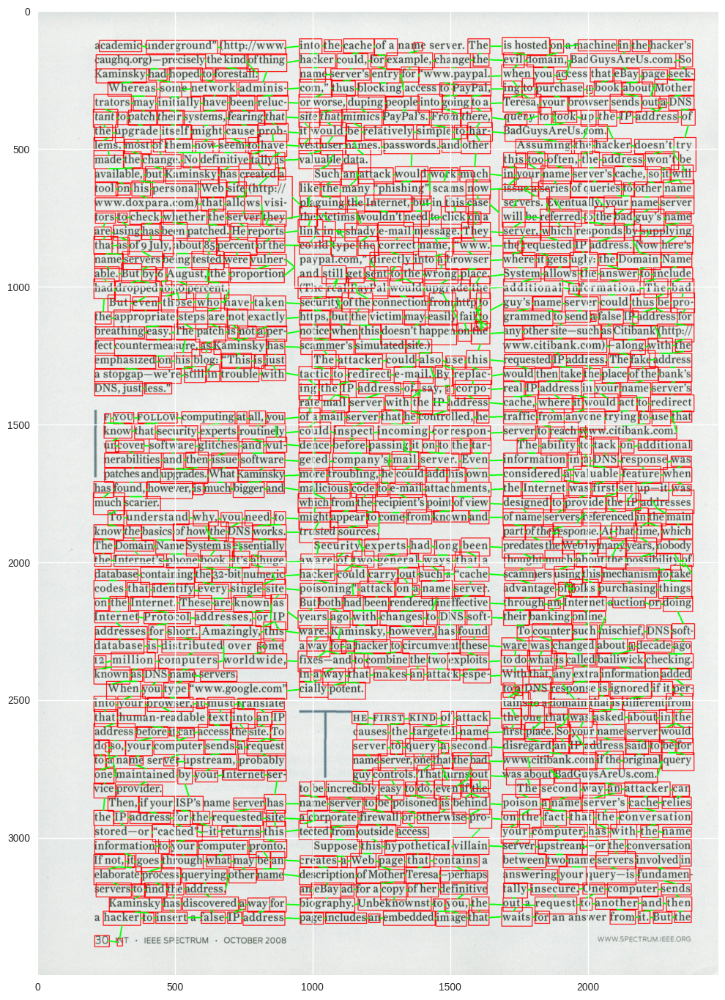

In [25]:
PATH = './Data/'

for i in [29, 68, 101, 145, 152, 159, 174, 201, 232, 250]:
    img = plt.imread(os.path.join(PATH, 'images', f'{i}.jpg'))
    df = pd.read_csv(os.path.join(PATH, 'CSV', f'TLBR_{i}.csv'))
     
    img_boxes = visualize_bboxes(img, df)
    
    df['Top-Left'] = df['Top-Left'].apply(ast.literal_eval)
    df['Bottom-Right'] = df['Bottom-Right'].apply(ast.literal_eval)
    
    wc = WordCluster(df, img_boxes, 60, 50)
    wc.fit()
    
    plt.figure(figsize=(12, 20))
    plt.imshow(wc.img)
    plt.show()